<a href="https://colab.research.google.com/github/Luciahelenasantos/Deep_Learning/blob/main/SPRINTII3006.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***1. Importando as bibliotecas necessárias para executar o notebook***

In [1]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg # para uso de imagens
import sklearn.metrics as skm
import itertools
from google.colab import drive # acesso ao drive do google Colab - 'drive.mount'
from sklearn.model_selection import train_test_split # para divisão de treino e teste
from keras import models
from keras import layers
from keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix, classification_report
from datetime import datetime
from tensorflow import keras

# ***2. Funções necessárias para executar o notebook***

In [2]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=360)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

In [3]:
# Função que cria a variável "class" com valores categóricos

def calcula_classe_fire(fire):
  vfire = fire

  if fire == 0:
    return "Sem fogo"
  elif fire == 1:
    return "Com fogo"

# ***3. Acessando e tratando os dados que serão a entrada do modelo de deep learning***

In [4]:
# Apontando para My Drive

drive.mount('/content/drive', force_remount=True)
os.chdir('/content/drive/My Drive/')

Mounted at /content/drive


In [5]:
# Acessando o diretório das imagens

r = 'datafire/working/train_images/train/'
print(os.listdir(r))

['0_jpg.rf.cd90e03cb5ea31ca281f0d02c1e5b0ac.jpg', '103_jpg.rf.302df056ae50651c0ea9e4a596cfd1ac.jpg', '106_jpg.rf.fc7418764a8fb61ad751e3d675a0112a.jpg', '112_jpg.rf.827880f69f4d033a5004aa34680b03d2.jpg', '124_jpg.rf.6b2acb65dc65dd3d1bf34e25b9a6bc72.jpg', '126_jpg.rf.611d235c791bd9d6e0897f4e159ad53a.jpg', '141_jpg.rf.81625a9961330a78ac9ce1a58d13c51a.jpg', '151_jpg.rf.ade9bcd3b67a1f8ce293eb7f2fc639b1.jpg', '15_jpg.rf.217b657ee3454b40c135d2be916e37f6.jpg', '217_jpg.rf.6e9e43118c4e54c03dc3cb2639087334.jpg', '240_jpg.rf.242a32a5b9fe02f8e7bf5147df309352.jpg', '241_jpg.rf.718d302d158e9ec187c61fa91033add7.jpg', '24_jpg.rf.c5fdcf5e9909f12c31fe6003da2e2c24.jpg', '278_jpg.rf.eb06c914510f543113dbf187494c78af.jpg', '286_jpg.rf.b46eadc42b97982518b4ec877d8fba45.jpg', '304_jpg.rf.04c6723a2a83c8d12405ee39bbc02370.jpg', '305_jpg.rf.e5a965197b20132f97392af82891181a.jpg', '309_jpg.rf.7ceaccac8cbf12dfd25e66cb991b6327.jpg', '32_jpg.rf.c87271986e34393741c8455d00ea80ea.jpg', '341_jpg.rf.ef22234027f42ff17e0e415

In [6]:
# Obtendo o nome das 20 primeiras imagens acessadas

print(f"Primeiras 20 imagens: \n {os.listdir(r)[:20]}")

Primeiras 20 imagens: 
 ['0_jpg.rf.cd90e03cb5ea31ca281f0d02c1e5b0ac.jpg', '103_jpg.rf.302df056ae50651c0ea9e4a596cfd1ac.jpg', '106_jpg.rf.fc7418764a8fb61ad751e3d675a0112a.jpg', '112_jpg.rf.827880f69f4d033a5004aa34680b03d2.jpg', '124_jpg.rf.6b2acb65dc65dd3d1bf34e25b9a6bc72.jpg', '126_jpg.rf.611d235c791bd9d6e0897f4e159ad53a.jpg', '141_jpg.rf.81625a9961330a78ac9ce1a58d13c51a.jpg', '151_jpg.rf.ade9bcd3b67a1f8ce293eb7f2fc639b1.jpg', '15_jpg.rf.217b657ee3454b40c135d2be916e37f6.jpg', '217_jpg.rf.6e9e43118c4e54c03dc3cb2639087334.jpg', '240_jpg.rf.242a32a5b9fe02f8e7bf5147df309352.jpg', '241_jpg.rf.718d302d158e9ec187c61fa91033add7.jpg', '24_jpg.rf.c5fdcf5e9909f12c31fe6003da2e2c24.jpg', '278_jpg.rf.eb06c914510f543113dbf187494c78af.jpg', '286_jpg.rf.b46eadc42b97982518b4ec877d8fba45.jpg', '304_jpg.rf.04c6723a2a83c8d12405ee39bbc02370.jpg', '305_jpg.rf.e5a965197b20132f97392af82891181a.jpg', '309_jpg.rf.7ceaccac8cbf12dfd25e66cb991b6327.jpg', '32_jpg.rf.c87271986e34393741c8455d00ea80ea.jpg', '341_jpg.rf

In [7]:
# Lendo o arquivo csv com as informações das imagens

df = pd.read_csv('datafire/working/train_images/_annotations.csv', delimiter = ';')

In [8]:
# Verificando a estrutura do arquivo df

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 787 entries, 0 to 786
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  787 non-null    object
 1   width     787 non-null    int64 
 2   height    787 non-null    int64 
 3   xmin      787 non-null    int64 
 4   ymin      787 non-null    int64 
 5   xmax      787 non-null    int64 
 6   ymax      787 non-null    int64 
 7   class     787 non-null    int64 
dtypes: int64(7), object(1)
memory usage: 49.3+ KB


In [9]:
# Criando a variável numérica que identifica a classificação do AQI para cada poluente

df['class1'] = df['class'].apply(calcula_classe_fire)

In [10]:
# Verificando o dataset criado

df.head()

,filename,width,height,xmin,ymin,xmax,ymax,class,class1
0,ck0tyk5ussex90863mbb4h9of_jpeg_jpg.rf.d0a27e22...,448,448,267,198,428,266,0,Sem fogo
1,img_924_jpg.rf.d10505c94256b4b2a78d140f812dea1...,448,448,112,135,384,427,0,Sem fogo
2,ck0ug3zlfw61d09445i888ftl_jpeg_jpg.rf.d1bd5da4...,448,448,70,146,288,285,0,Sem fogo
3,ck0t2d3kbyou40a46a56kl6x8_jpeg_jpg.rf.d1d5fc7d...,448,448,270,202,326,231,0,Sem fogo
4,ck0ujzue9uicd08638rcyl1ro_jpeg_jpg.rf.d215ddd1...,448,448,49,147,284,289,0,Sem fogo


In [11]:
df

,filename,width,height,xmin,ymin,xmax,ymax,class,class1
0,ck0tyk5ussex90863mbb4h9of_jpeg_jpg.rf.d0a27e22...,448,448,267,198,428,266,0,Sem fogo
1,img_924_jpg.rf.d10505c94256b4b2a78d140f812dea1...,448,448,112,135,384,427,0,Sem fogo
2,ck0ug3zlfw61d09445i888ftl_jpeg_jpg.rf.d1bd5da4...,448,448,70,146,288,285,0,Sem fogo
3,ck0t2d3kbyou40a46a56kl6x8_jpeg_jpg.rf.d1d5fc7d...,448,448,270,202,326,231,0,Sem fogo
4,ck0ujzue9uicd08638rcyl1ro_jpeg_jpg.rf.d215ddd1...,448,448,49,147,284,289,0,Sem fogo
...,...,...,...,...,...,...,...,...,...
782,ck0tzttgusl7o0863k0kfvcid_jpeg_jpg.rf.7ffc4f55...,448,448,105,192,145,210,0,Sem fogo
783,ck0keprw9ke1d08483vmle7ed_jpeg_jpg.rf.7a4625db...,448,448,1,105,105,311,0,Sem fogo
784,ck0keo0re4xll086378211i65_jpeg_jpg.rf.80562d84...,448,448,136,194,149,215,0,Sem fogo
785,ck0lxe157jywu0721jwuvnom0_jpeg_jpg.rf.7adfcd1d...,448,448,117,241,136,259,0,Sem fogo


In [12]:
# Renomeando o atributo filename como images para uso nas células de código segintes

df.rename(columns = {'filename' :'images'}, inplace = True);

In [13]:
# Criando um dataset com as informações das imagens

images = os.listdir(r)

"""images = os.listdir(r)

labels, heights, widths, channels, filesize = [], [], [], [], []

# Loop que percorre cada uma das imagens extraídas
for fname in images:
  labels.append(str(fname)[:3])
  img_shape = mpimg.imread(r+fname).shape
  heights.append(img_shape[0])
  widths.append(img_shape[1])
  channels.append(img_shape[2])
  filesize.append(os.path.getsize(r+fname))

# Criação do dataset
df2 = pd.DataFrame({'images': images, 'class': labels, 'height': heights,
                         'width': widths, 'channels': channels, 'filesize': filesize})
"""

"images = os.listdir(r)\n\nlabels, heights, widths, channels, filesize = [], [], [], [], []\n\n# Loop que percorre cada uma das imagens extraídas\nfor fname in images:\n  labels.append(str(fname)[:3])\n  img_shape = mpimg.imread(r+fname).shape\n  heights.append(img_shape[0])\n  widths.append(img_shape[1])\n  channels.append(img_shape[2])\n  filesize.append(os.path.getsize(r+fname))\n\n# Criação do dataset\ndf2 = pd.DataFrame({'images': images, 'class': labels, 'height': heights,\n                         'width': widths, 'channels': channels, 'filesize': filesize})\n"

In [14]:
df.head()

,images,width,height,xmin,ymin,xmax,ymax,class,class1
0,ck0tyk5ussex90863mbb4h9of_jpeg_jpg.rf.d0a27e22...,448,448,267,198,428,266,0,Sem fogo
1,img_924_jpg.rf.d10505c94256b4b2a78d140f812dea1...,448,448,112,135,384,427,0,Sem fogo
2,ck0ug3zlfw61d09445i888ftl_jpeg_jpg.rf.d1bd5da4...,448,448,70,146,288,285,0,Sem fogo
3,ck0t2d3kbyou40a46a56kl6x8_jpeg_jpg.rf.d1d5fc7d...,448,448,270,202,326,231,0,Sem fogo
4,ck0ujzue9uicd08638rcyl1ro_jpeg_jpg.rf.d215ddd1...,448,448,49,147,284,289,0,Sem fogo


# ***4. Configuração de um modelo de deep learning usando uma rede neural convolucional (CNN) simples com a biblioteca Keras***

In [15]:
# Estabelecendo um padrão para a apresentação de gráficos

sns.set_style('darkgrid')
sns.set_theme(style="darkgrid", font_scale=0.9)

Sem fogo    536
Com fogo    251
Name: class1, dtype: int64


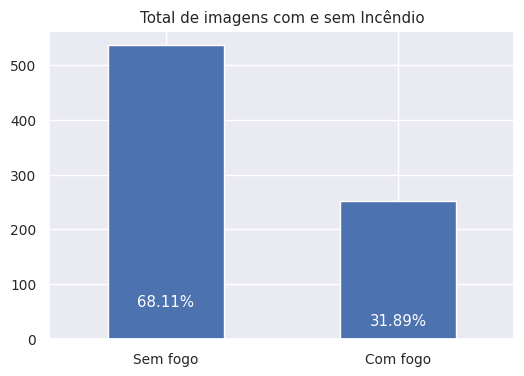

In [16]:
# Gráfico de barras com a distribuição da variável class1 usada como target

valores = df['class1'].value_counts(normalize=True) * 100
fig, ax = plt.subplots(figsize = (6, 4))
fire_count = df['class1'].value_counts().plot.bar(title='Total de imagens com e sem Incêndio')
print((df['class1']).value_counts())

# Adicionar o label no topo de cada barra
for i, valor in enumerate(valores):
    ax.text(i, valor, f'{valor:.2f}%', ha='center', va='center', c='white')

#plt.subplots_adjust(top=0.9)
plt.xticks(rotation=360)
plt.show()

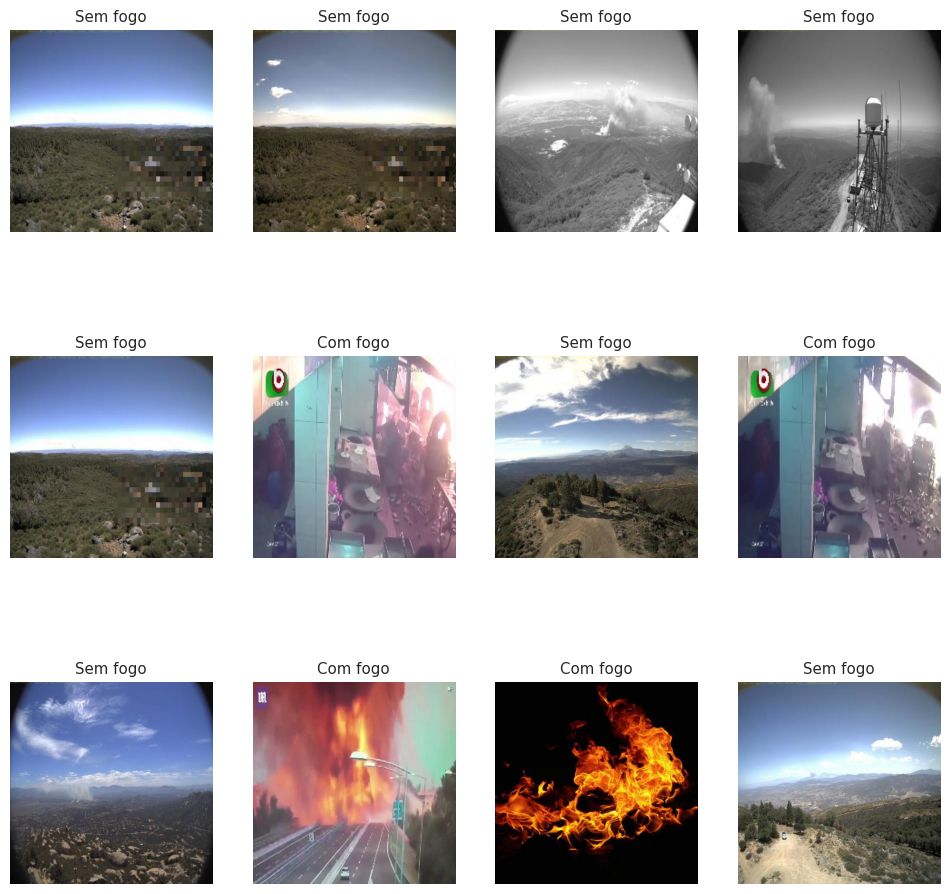

In [17]:
# Apreentando uma amostra de 12 imagens

fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando apenas 12 imagens
for i in range(12):

    sample = np.random.choice(images)
    img_path = r+sample
    sp = plt.subplot(3, 4, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.title(sample[:3])

    if sample[:3] == 'img':
      plt.title('Com fogo')
    if sample[:3] == 'ck0':
      plt.title('Sem fogo')
    else:
      plt.title('Com fogo')

plt.show()

Divisão dos dados em treino e teste: 30% das imagens para teste e 70% para treinamento do modelo de deep learning. Importante lembrar que os conjuntos devem ser disjuntos, ou seja, não devem poussir nenhum elemento em comum.

In [18]:
# Divisão dos dados entre treino e teste

train, test = train_test_split(df[['images' , 'class1']] ,test_size=0.3 ,random_state=42 , shuffle=True)

Sem fogo    378
Com fogo    172
Name: class1, dtype: int64


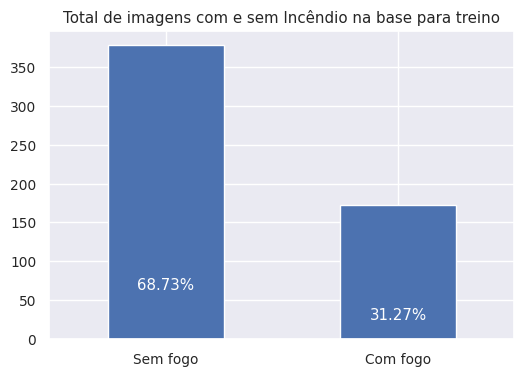

In [19]:
# Gráfico de barras com a distribuição da variável class1 usada como target base treino

valores = train['class1'].value_counts(normalize=True) * 100
fig, ax = plt.subplots(figsize = (6, 4))
fire_count = train['class1'].value_counts().plot.bar(title='Total de imagens com e sem Incêndio na base para treino')
print((train['class1']).value_counts())

# Adicionar o label no topo de cada barra
for i, valor in enumerate(valores):
    ax.text(i, valor, f'{valor:.2f}%', ha='center', va='center', c='white')

#plt.subplots_adjust(top=0.9)
plt.xticks(rotation=360)
plt.show()

Sem fogo    158
Com fogo     79
Name: class1, dtype: int64


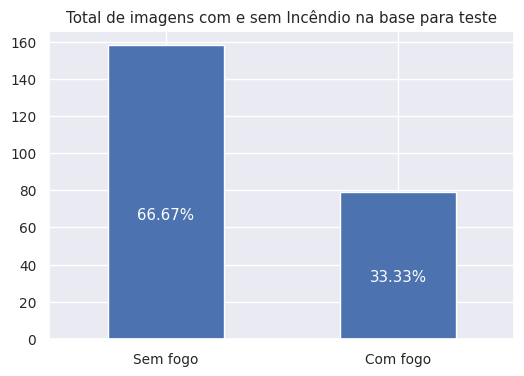

In [20]:
# Gráfico de barras com a distribuição da variável class1 usada como target base teste

valores = test['class1'].value_counts(normalize=True) * 100
fig, ax = plt.subplots(figsize = (6, 4))
fire_count = test['class1'].value_counts().plot.bar(title='Total de imagens com e sem Incêndio na base para teste')
print((test['class1']).value_counts())

# Adicionar o label no topo de cada barra
for i, valor in enumerate(valores):
    ax.text(i, valor, f'{valor:.2f}%', ha='center', va='center', c='white')

#plt.subplots_adjust(top=0.9)
plt.xticks(rotation=360)
plt.show()

In [21]:
# Visualizando a divisão dos dados treino e teste

print("##### Train: #####")
print(train)
print("##### Test: #####")
print(test)

##### Train: #####
                                                images    class1
585  ck0neh5qnjfoh0848s35xyyj8_jpeg_jpg.rf.3c6e3e02...  Sem fogo
679     64_jpg.rf.59a8908fd610f2932f736f388bf19616.jpg  Com fogo
24   img_117_jpg.rf.d9e779c154bfec9474df74afdd25308...  Com fogo
139  ck0twzaqtua2r0701hljesqvp_jpeg_jpg.rf.fbac690e...  Sem fogo
275  ck0kfjen48qhj0701wjkosmel_jpeg_jpg.rf.2b20ab2c...  Sem fogo
..                                                 ...       ...
71   img_127_jpg.rf.e74ff78e3f71c113bc30cdcfbb4ece1...  Com fogo
106  img_440_jpg.rf.f3da7bbf2783f3ed4fd9eda81096d7e...  Com fogo
270  ck0txvj9m6otr0848fayj9tte_jpeg_jpg.rf.24c52e89...  Sem fogo
435  ck0ng3zz98boz07013zyds00f_jpeg_jpg.rf.ad0c1686...  Sem fogo
102  ck0lwhatvfrid08386w2352zc_jpeg_jpg.rf.f052d421...  Sem fogo

[550 rows x 2 columns]
##### Test: #####
                                                images    class1
536  ck0kd86qe8gf507018qw8usfe_jpeg_jpg.rf.cfe8c4f9...  Sem fogo
39   ck0nfobvt4msi07944oj7bzx

##4.1 - Preparação dos dados

In [22]:
train_datagen=ImageDataGenerator(validation_split=0.2, #include validation split
                                 rescale = 1.0/255,
                                 rotation_range=40,
                                 shear_range=0.2,
                                 zoom_range=0.2,
                                 horizontal_flip=True,
                                 fill_mode='nearest')

test_datagen=ImageDataGenerator(rescale=1./255)


train_generator=train_datagen.flow_from_dataframe(
    train ,r,
    target_size=(150,150),
    batch_size=100,
    class_mode='binary',
    x_col='images',
    y_col='class1',
    subset='training' #training set
    )

val_generator=train_datagen.flow_from_dataframe(
    train ,r,
    target_size=(150,150),
    batch_size=100,
    class_mode='binary',
    x_col='images',
    y_col='class1',
    subset='validation' #validation set
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,r,
    target_size=(150,150),
    batch_size=100,
    class_mode='binary',
    x_col='images',
    y_col='class1')

Found 440 validated image filenames belonging to 2 classes.
Found 110 validated image filenames belonging to 2 classes.
Found 237 validated image filenames belonging to 2 classes.


Found 1 validated image filenames belonging to 1 classes.


<Figure size 1200x1200 with 0 Axes>

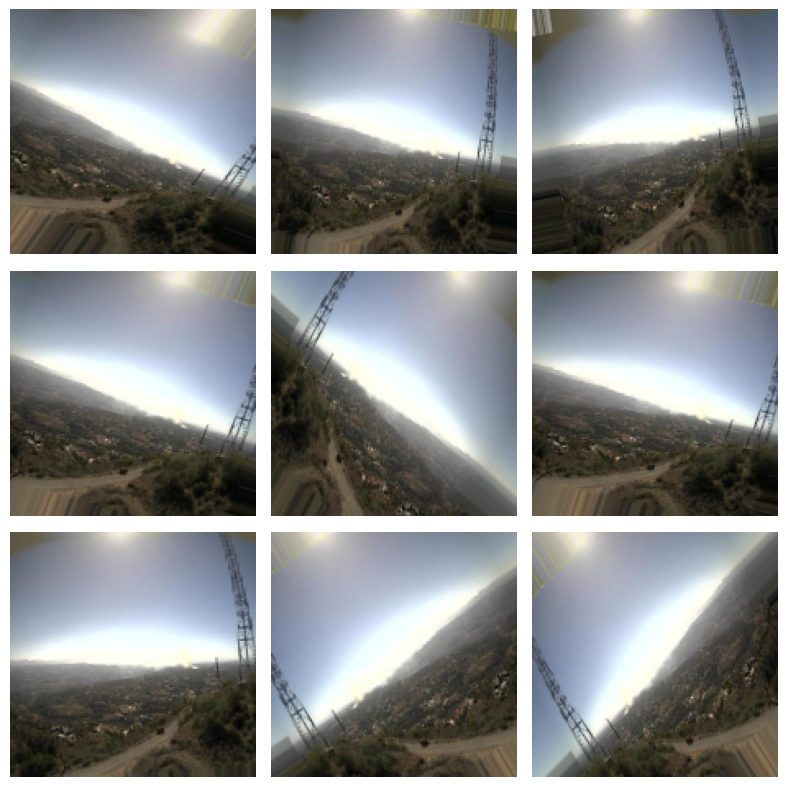

In [23]:
fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Pegando um registro do dataframe
sample = df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    r,
    x_col='images',
    y_col='class1',
    target_size=(150,150),
    class_mode='categorical'
)

plt.figure(figsize=(8, 8))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

# ***5. Configuração de um modelo de deep learning usando uma rede neural convolucional (CNN) simples com a biblioteca Keras***

##5.1 - Definição da arquitetura do modelo

In [24]:
model=models.Sequential()
model.add(layers.Conv2D(32 ,(3,3) , activation='relu' , input_shape=(150,150,3 ) ) )
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(64 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [25]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 1 , activation='sigmoid' ) )

In [26]:
# Resumo da arquitetura do modelo

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

# ***6. Treinamento do modelo de deep learning***

##6.1 - Compilação do modelo Keras com as configurações do treinamento

In [27]:
model.compile(optimizer='adam', loss='binary_crossentropy' , metrics=['accuracy'])

In [28]:
history=model.fit_generator(train_generator,
                            epochs=15,
                            validation_data=val_generator)

<ipython-input-28-c7fb0de44f60>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history=model.fit_generator(train_generator,


Epoch 1/15
5/5 [==============================] - 21s 1s/step - loss: 0.6296 - accuracy: 0.6455 - val_loss: 0.5537 - val_accuracy: 0.6909
Epoch 2/15
5/5 [==============================] - 5s 1s/step - loss: 0.4046 - accuracy: 0.8000 - val_loss: 0.9300 - val_accuracy: 0.5818
Epoch 3/15
5/5 [==============================] - 5s 1s/step - loss: 0.4651 - accuracy: 0.8023 - val_loss: 0.2506 - val_accuracy: 0.9273
Epoch 4/15
5/5 [==============================] - 6s 1s/step - loss: 0.2853 - accuracy: 0.8932 - val_loss: 0.2684 - val_accuracy: 0.9000
Epoch 5/15
5/5 [==============================] - 7s 1s/step - loss: 0.2070 - accuracy: 0.9159 - val_loss: 0.2439 - val_accuracy: 0.8818
Epoch 6/15
5/5 [==============================] - 5s 1s/step - loss: 0.2305 - accuracy: 0.8818 - val_loss: 0.1285 - val_accuracy: 0.9818
Epoch 7/15
5/5 [==============================] - 6s 1s/step - loss: 0.1914 - accuracy: 0.9182 - val_loss: 0.1619 - val_accuracy: 0.9364
Epoch 8/15
5/5 [========================

# ***7. Execução do modelo treinado em um subconjunto das imagems de teste***

4/4 [==============================] - 1s 47ms/step


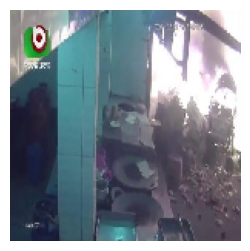

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.011713907


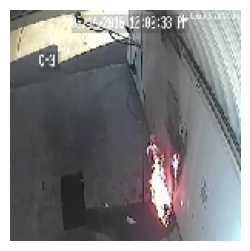

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.0075310506


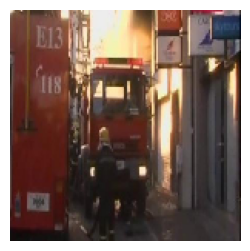

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.050774667


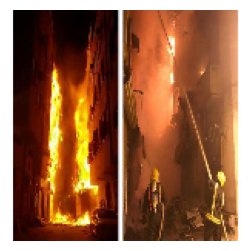

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.005802755


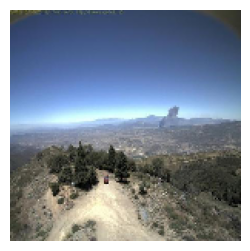

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999484


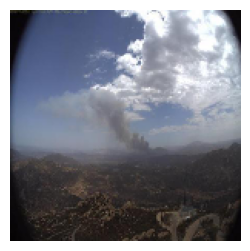

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.999413


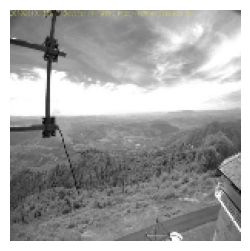

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9794601


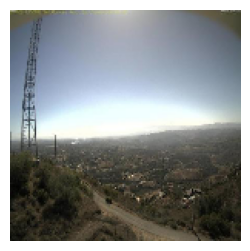

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.999998


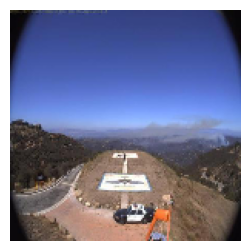

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9971738


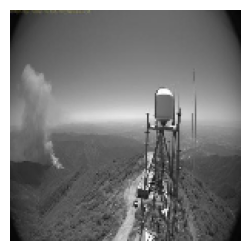

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99630874


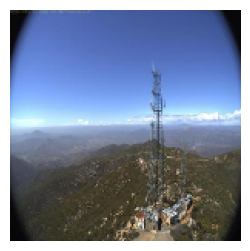

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99998164


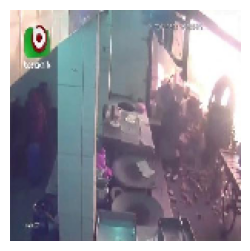

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.0059667598


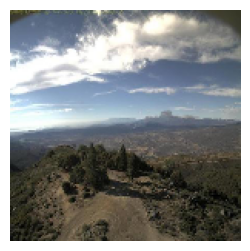

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.999943


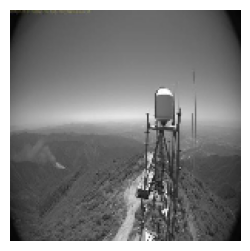

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9959006


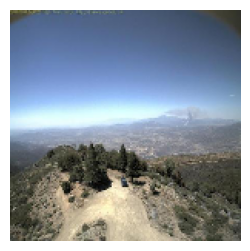

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99999285


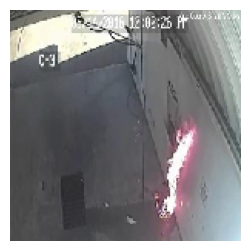

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.0125616295


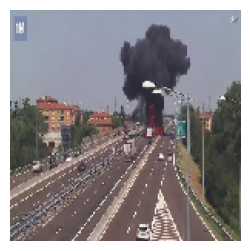

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.047222547


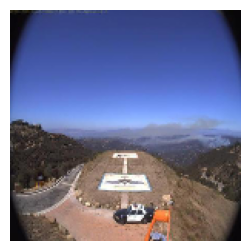

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99764234


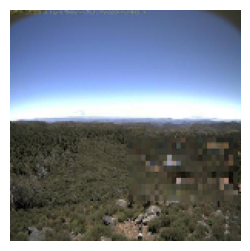

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999523


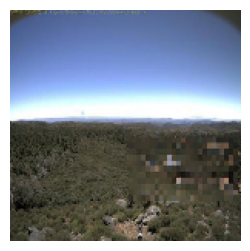

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999523


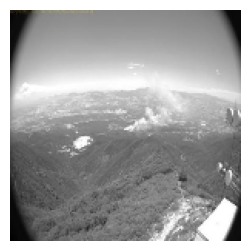

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99049616


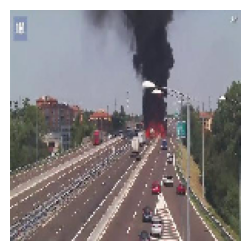

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.0573076


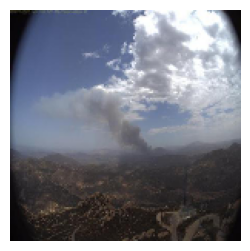

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99939823


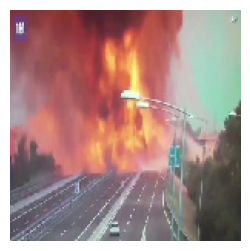

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.013358264


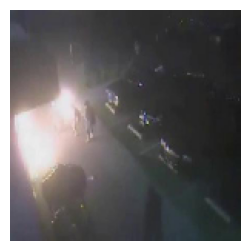

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.26112682


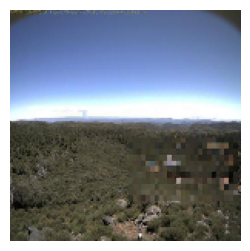

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999629


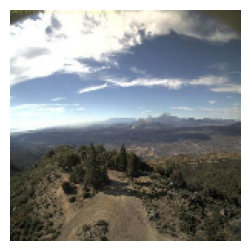

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999696


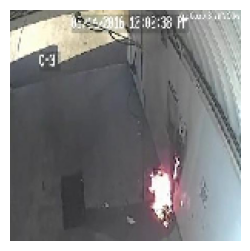

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.009280465


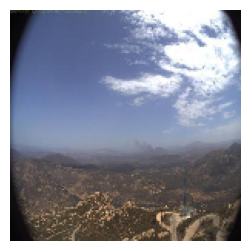

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9998765


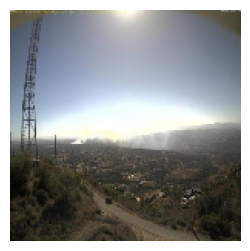

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999976


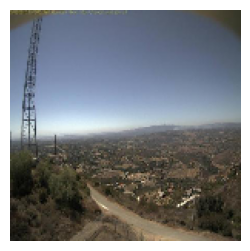

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.999984


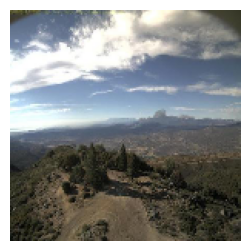

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999471


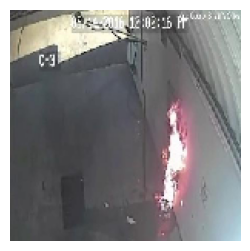

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.011039513


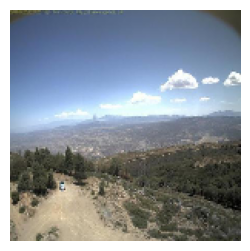

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99999535


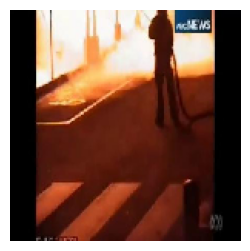

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.0021528515


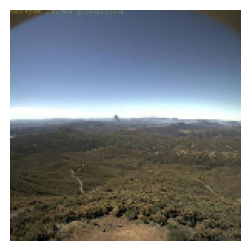

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99998593


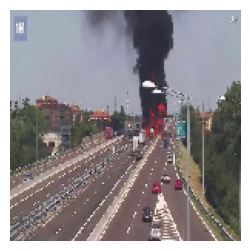

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.04624232


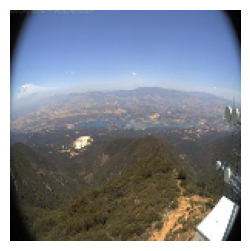

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9989256


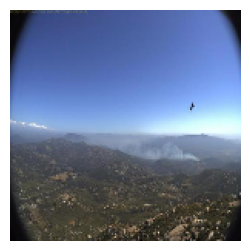

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999405


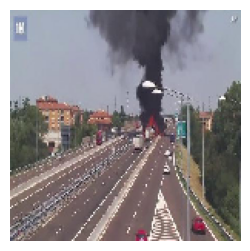

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.04761084


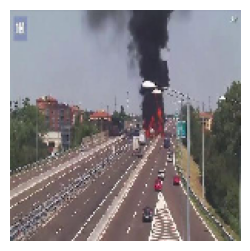

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.049977336


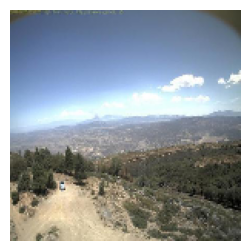

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999949


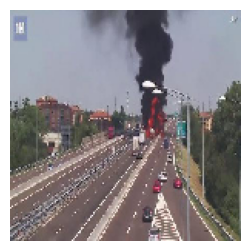

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.044736538


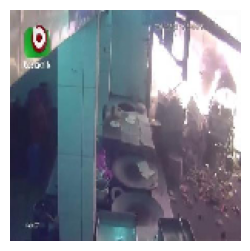

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.009036469


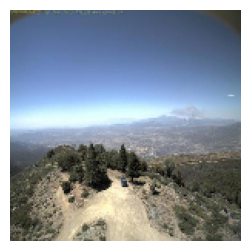

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999925


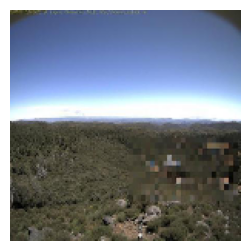

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999672


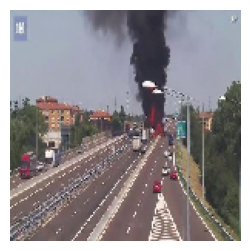

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.0424118


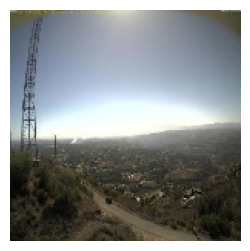

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999981


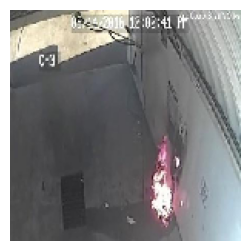

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.0086351475


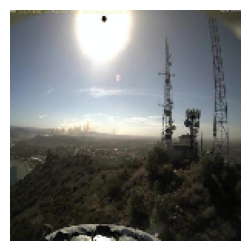

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9994752


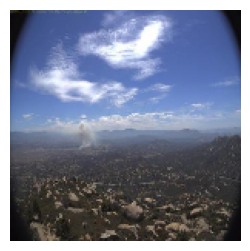

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99999


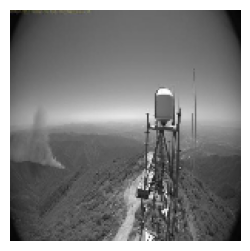

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99577063


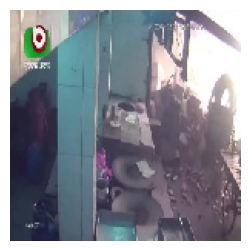

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.0065520024


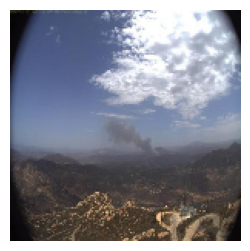

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9997508


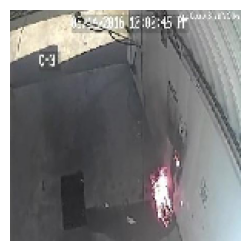

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.012391146


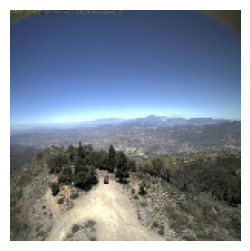

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99995697


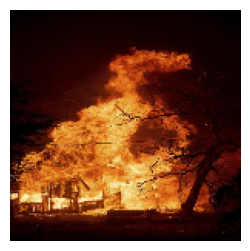

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.0036723607


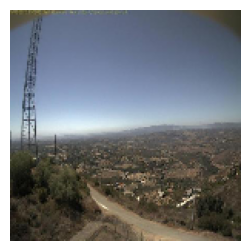

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999846


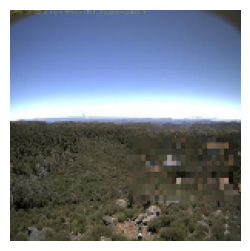

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999521


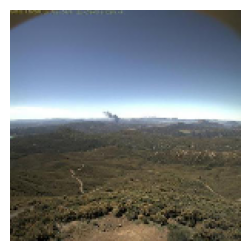

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999869


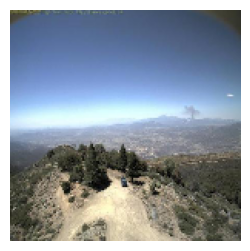

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999924


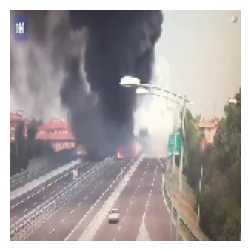

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.53444904


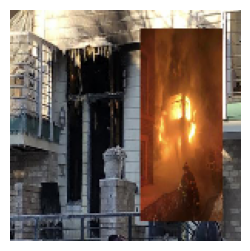

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.017955815


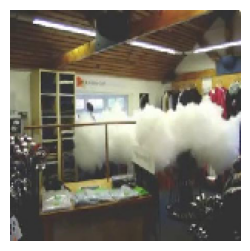

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.24857391


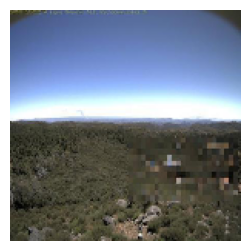

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99995613


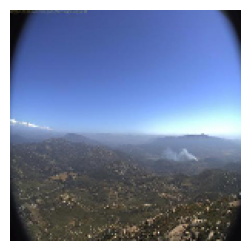

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999639


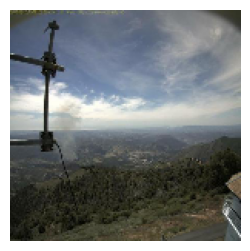

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99882394


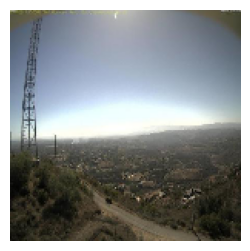

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.999998


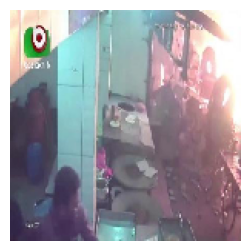

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.004151699


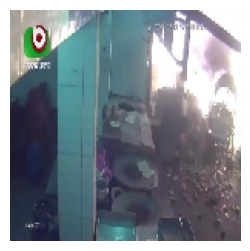

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.011515154


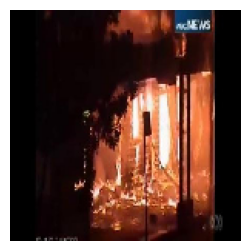

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.001982319


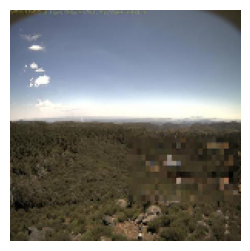

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9996753


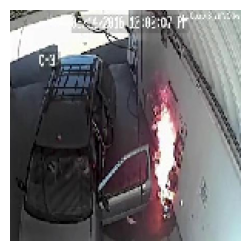

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.0049389717


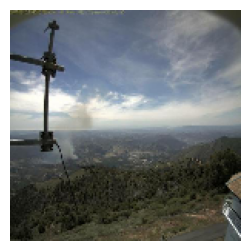

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9983089


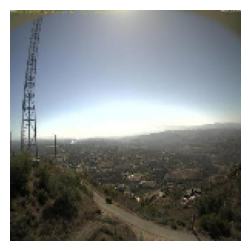

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99999785


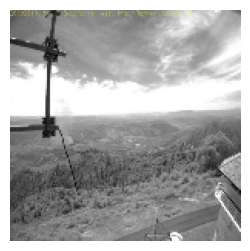

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9730617


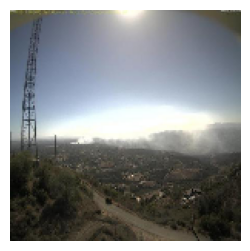

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.999997


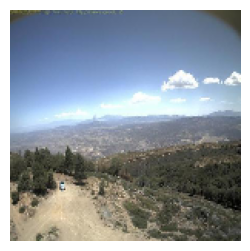

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999958


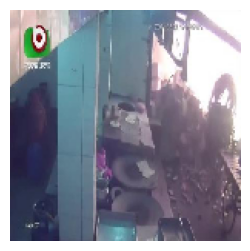

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.0062669115


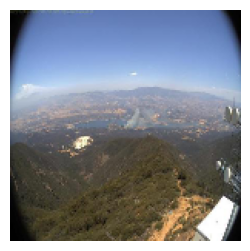

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9989994


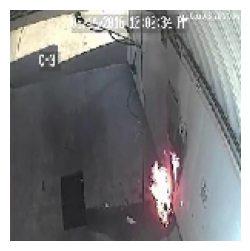

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.010585666


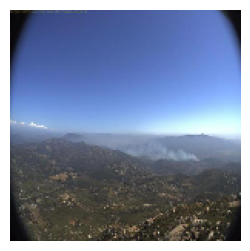

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99995327


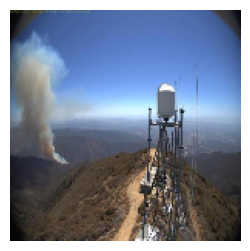

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9981817


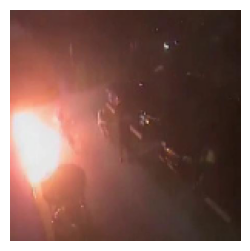

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.05167301


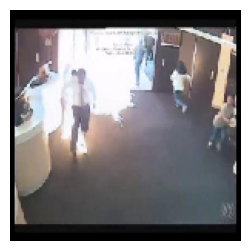

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.019993175


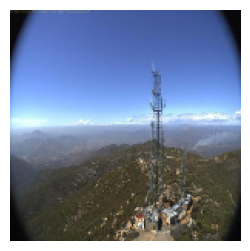

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99998033


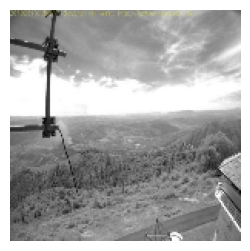

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9672993


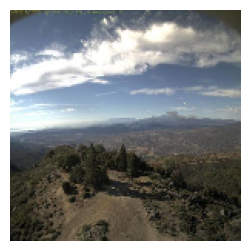

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99992144


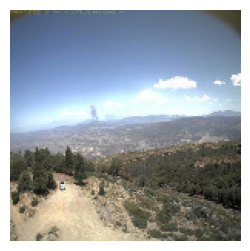

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999951


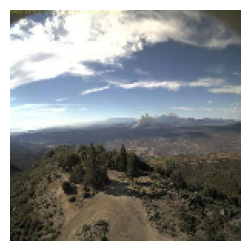

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999597


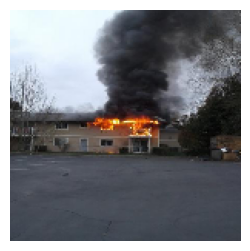

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.008486053


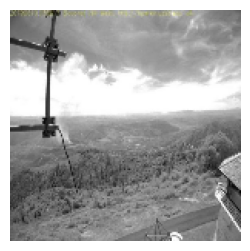

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.97306246


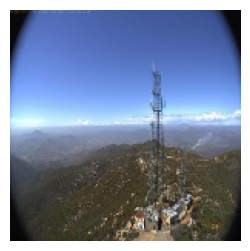

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999802


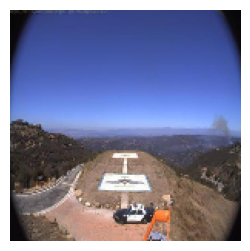

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99759346


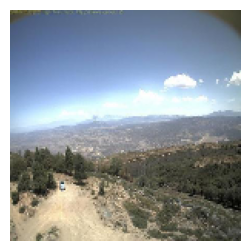

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.999995


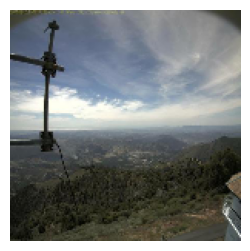

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9989624


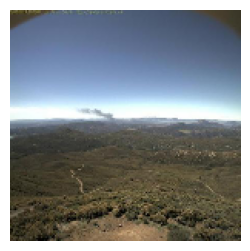

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99998665


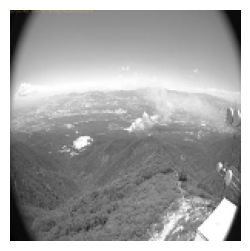

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9907623


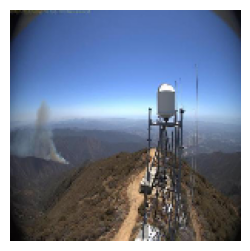

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99847835


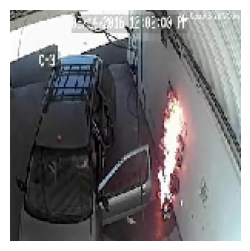

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.005542253


In [29]:
count = 0
y_pred = list()
y_true = list()
class_names = ['Com fogo', 'Sem fogo']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'Sem fogo' if prediction >= 0.5 else 'Com fogo'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.figure(figsize=(3, 3))
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

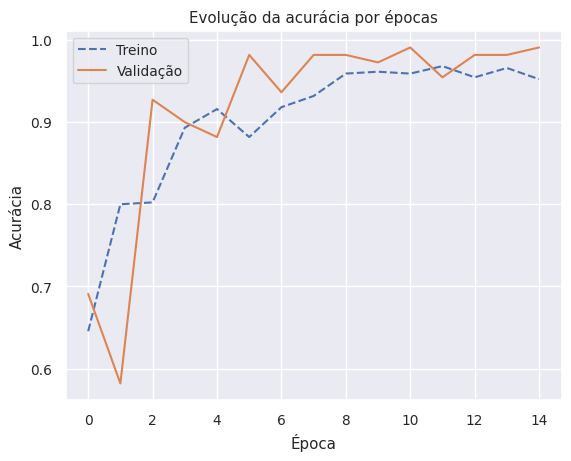

In [30]:
# livro jornada python pag 493
plt.xlabel('Época')
plt.ylabel('Acurácia')
plt.plot(history.history['accuracy'], '--')
plt.plot(history.history['val_accuracy'])
plt.title("Evolução da acurácia por épocas")
plt.legend(['Treino', 'Validação'])
plt.show();

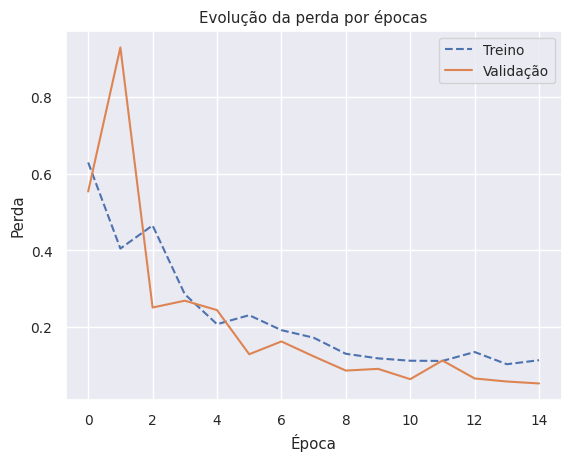

In [31]:
# livro jornada python pag 493
plt.xlabel('Época')
plt.ylabel('Perda')
plt.plot(history.history['loss'], '--')
plt.plot(history.history['val_loss'])
plt.title("Evolução da perda por épocas")
plt.legend(['Treino', 'Validação'])
plt.show();

# ***8. Avaliação do modelo de deep learning***

In [32]:
loss, accuracy = model.evaluate_generator(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

<ipython-input-32-78954c843b8c>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  loss, accuracy = model.evaluate_generator(test_generator)


Test: accuracy = 0.987342  ;  loss = 0.030730 


In [33]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.99
Precision:  0.9902857142857142
Recall:  0.99
F1 Score:  0.9900342958291846


Confusion matrix, without normalization
[[34  0]
 [ 1 65]]


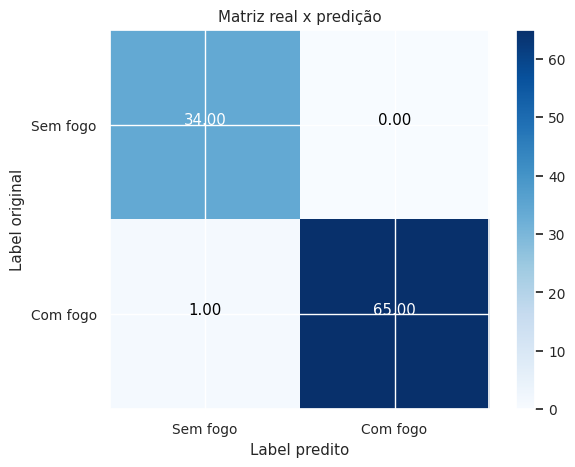

In [34]:
"""import matplotlib.pyplot as plt
import numpy as np
import itertools"""

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion Matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=360)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, "{:.2f}".format(cm[i, j]),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('Label original')
    plt.xlabel('Label predito')
    plt.tight_layout()

# Exemplo de uso
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['Sem fogo',
                               'Com fogo'],
                      normalize=False,
                      title='Matriz real x predição')

plt.show()


# ***9. Exportação do modelo de deep learning para posterior uso***

In [35]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = 'datasets/dogs_vs_cats/trained_models'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2023-07-03T1647.h5


# ***10. Teste do modelo exportado***

In [36]:
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model_2023-07-03T1647.h5 carregado com sucesso


2/2 [==============================] - 0s 206ms/step


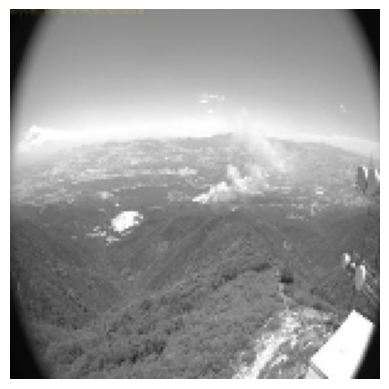

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99049616


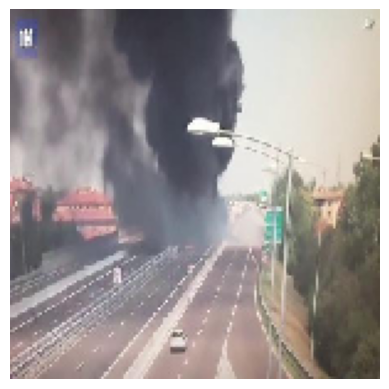

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.36721128


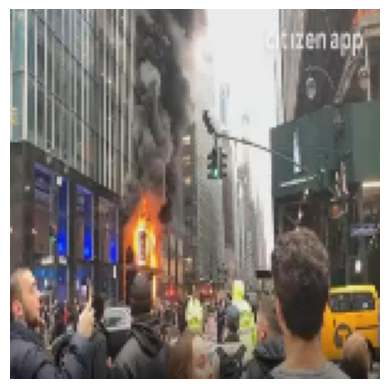

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.05784889


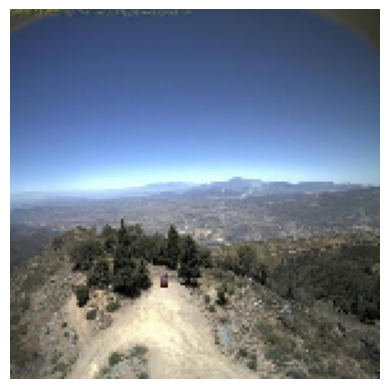

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999542


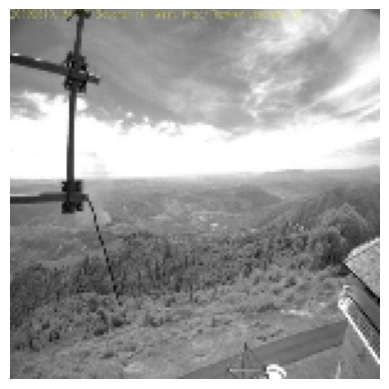

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9730617


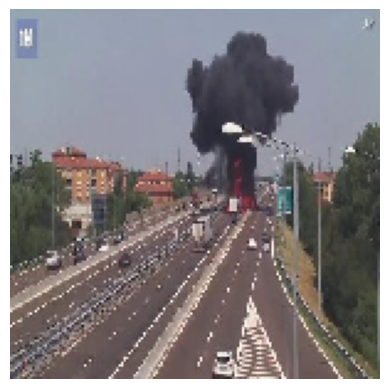

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.047222547


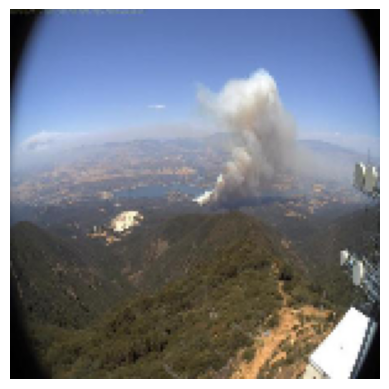

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99828655


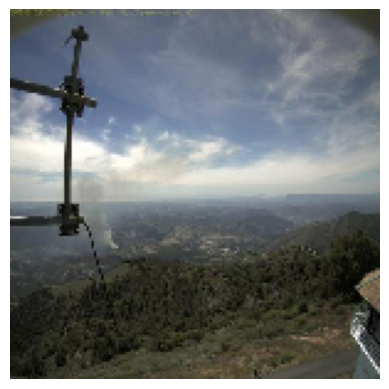

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99797493


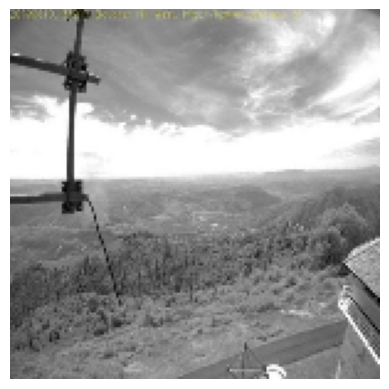

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9720896


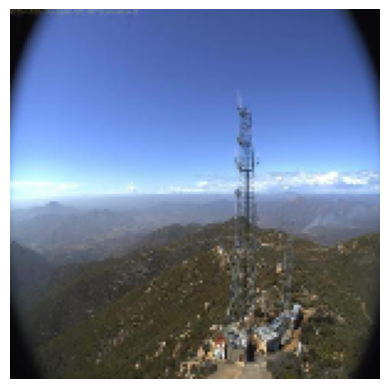

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99997854


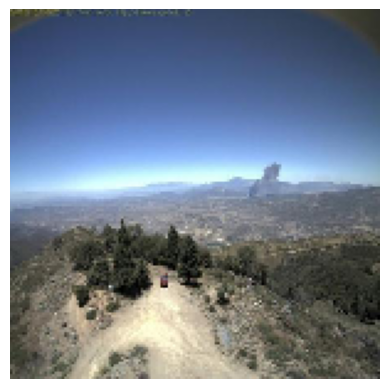

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999484


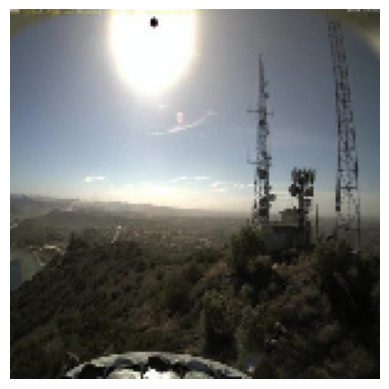

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.999458


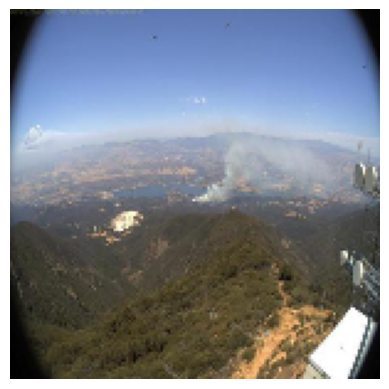

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99922395


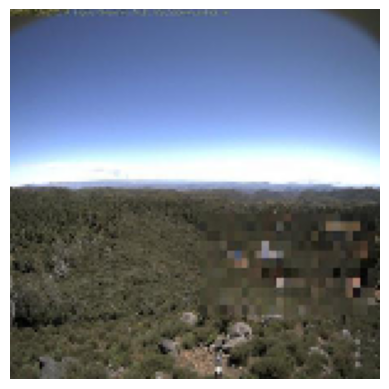

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999645


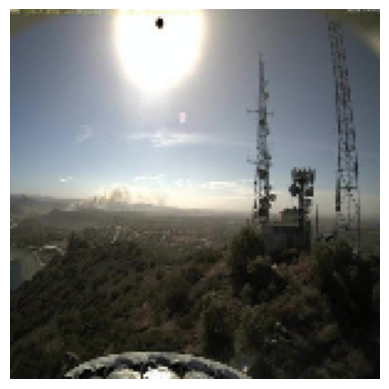

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9994555


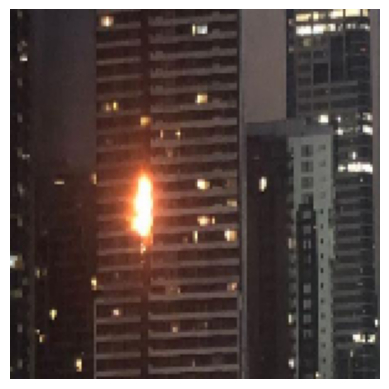

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.06831826


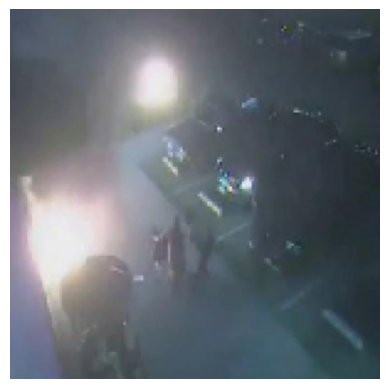

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.12195548


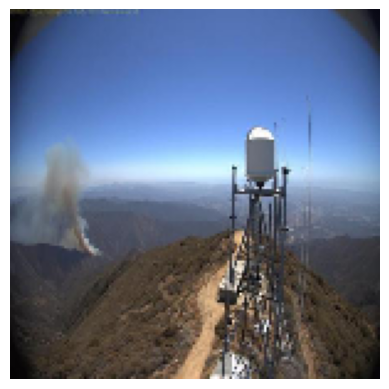

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99832255


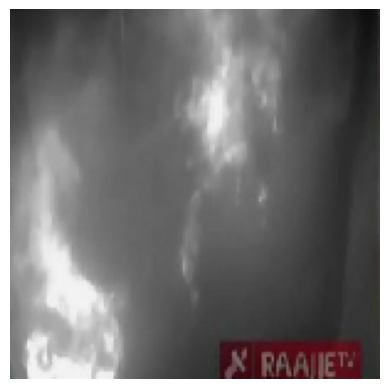

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.46802518


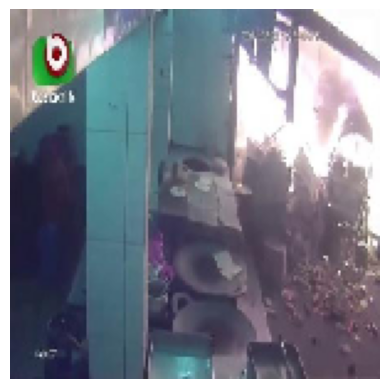

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.009036469


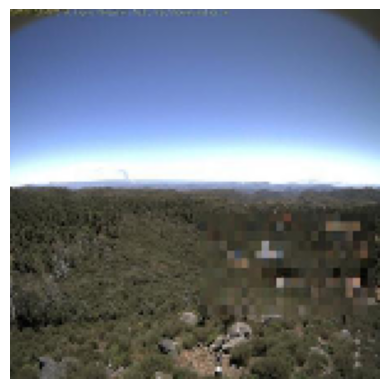

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99995756


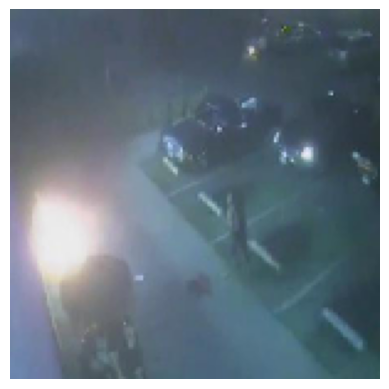

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.042043447


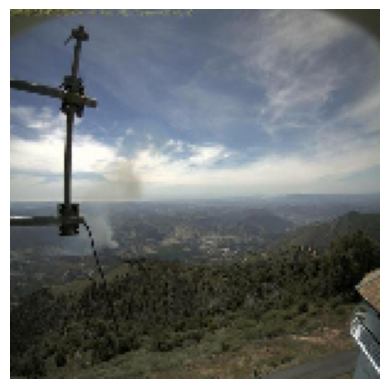

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9983089


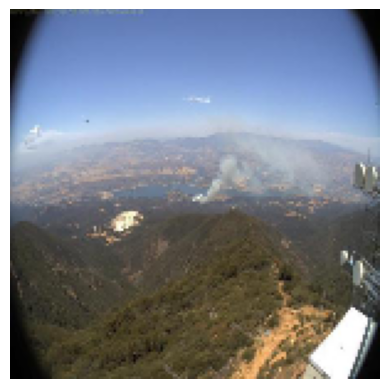

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9992053


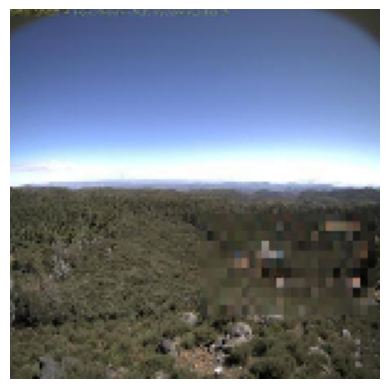

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999671


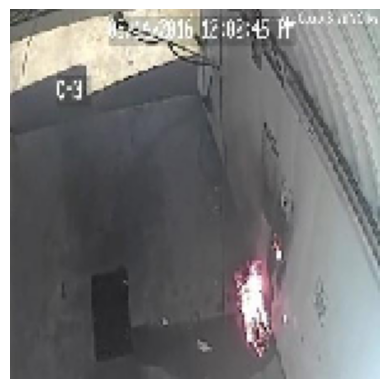

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.012391146


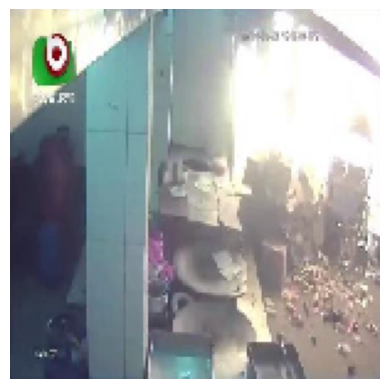

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.00758821


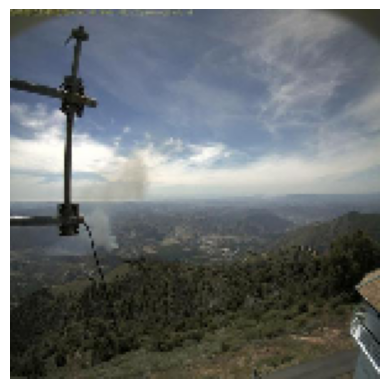

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9980956


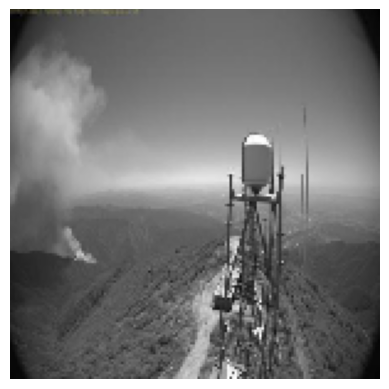

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9945633


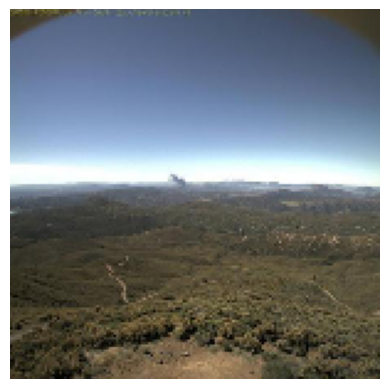

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99998593


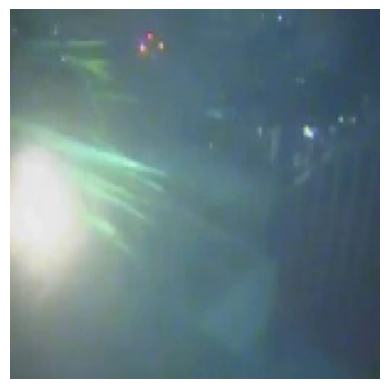

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.029259017


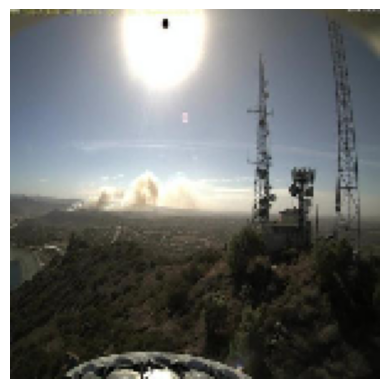

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9993088


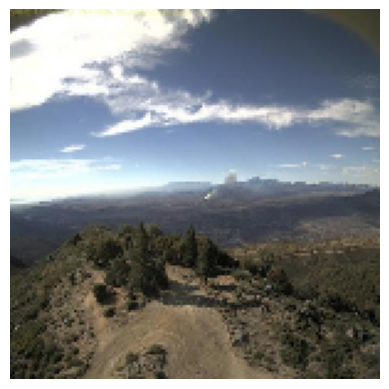

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999782


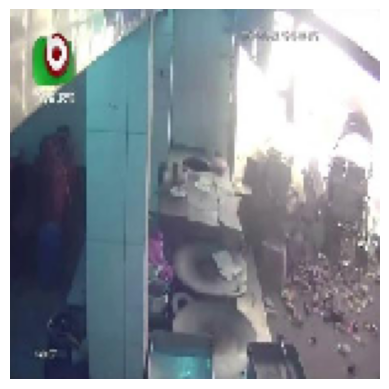

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.008906959


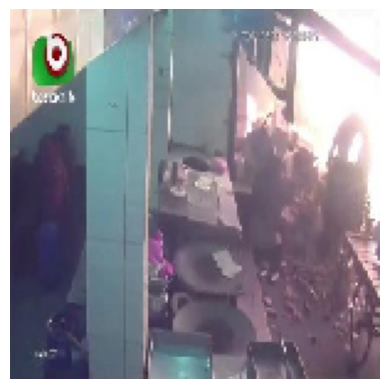

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.0059667705


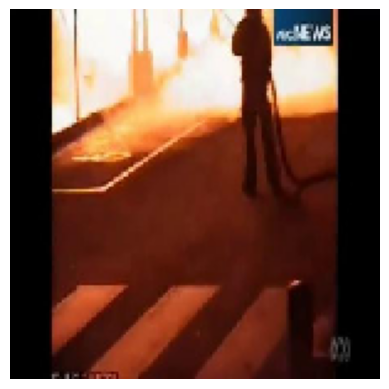

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.0021528534


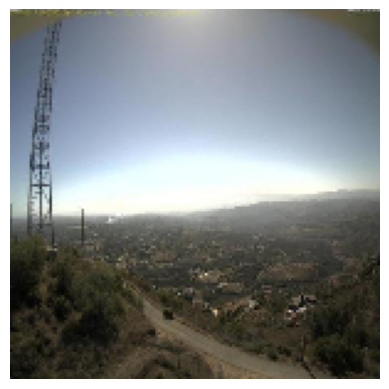

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99999785


In [37]:
count = 0
y_pred = list()
y_true = list()
class_names = ['Com fogo', 'Sem fogo']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = loaded_model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'Sem fogo' if prediction >= 0.5 else 'Com fogo'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)